In [1]:
import os
import shutil
from pathlib import Path
from sklearn.model_selection import train_test_split

# Define the paths
original_data_dir = Path(r"C:\Users\admin\Documents\BIRDS\birds\CUB_200_2011_new\CUB_200_2011\images")
output_base_dir = Path(r"C:\Users\admin\Documents\BIRDS\Birds525")

train_dir = output_base_dir / "train"
val_dir = output_base_dir / "valid"
test_dir = output_base_dir / "test"

# Create output directories
for folder in [train_dir, val_dir, test_dir]:
    folder.mkdir(parents=True, exist_ok=True)

# Split data for each species folder
for species_folder in original_data_dir.iterdir():
    if species_folder.is_dir():
        species_name = species_folder.name
        images = list(species_folder.glob('*.*'))
        
        # Train, validation, and test split (e.g., 70% train, 15% validation, 15% test)
        train_images, test_images = train_test_split(images, test_size=0.3, random_state=42)
        val_images, test_images = train_test_split(test_images, test_size=0.5, random_state=42)

        # Helper function to copy images to their respective directories
        def copy_images(image_list, target_dir):
            target_species_dir = target_dir / species_name
            target_species_dir.mkdir(parents=True, exist_ok=True)
            for image in image_list:
                shutil.copy(image, target_species_dir / image.name)

        # Copy images to train, valid, and test folders
        copy_images(train_images, train_dir)
        copy_images(val_images, val_dir)
        copy_images(test_images, test_dir)

print("Dataset successfully split into train, validation, and test sets.")


Dataset successfully split into train, validation, and test sets.


In [2]:
# system libraries
import os

from pathlib import Path
import pandas as pd

######################### TRAIN #########################
train_path = 'Birds525/train'

train_dir = Path(train_path)

filepaths = list(train_dir.glob(r'**/*.JPG')) + list(train_dir.glob(r'**/*.jpg')) + list(train_dir.glob(r'**/*.png')) + list(train_dir.glob(r'**/*.png'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

train_df = pd.concat([filepaths, labels], axis=1)

######################### VALIDATION #########################

val_path = 'Birds525/valid'

val_dir = Path(val_path)

filepaths = list(val_dir.glob(r'**/*.JPG')) + list(val_dir.glob(r'**/*.jpg')) + list(val_dir.glob(r'**/*.png')) + list(val_dir.glob(r'**/*.png'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

val_df = pd.concat([filepaths, labels], axis=1)

######################### TEST #########################

test_path = 'Birds525/test'

test_dir = Path(test_path)

filepaths = list(test_dir.glob(r'**/*.JPG')) + list(test_dir.glob(r'**/*.jpg')) + list(test_dir.glob(r'**/*.png')) + list(test_dir.glob(r'**/*.png'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

test_df = pd.concat([filepaths, labels], axis=1)

In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Rescale all images by 1/255. 
# Neural Networks work better with smaller input values
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

train_generator = train_datagen.flow_from_dataframe(train_df
                                                   ,x_col='Filepath'
                                                   ,y_col='Label'
                                                   ,target_size = (150, 150)
                                                   ,batch_size = 20
                                                   ,shuffle = True
                                                   )

# The validation generator will leverage off our test data generator because we'll want to test our trained model on the same properties
validation_generator = test_datagen.flow_from_dataframe(val_df
                                                       ,x_col='Filepath'
                                                       ,y_col='Label'
                                                       ,target_size = (150, 150)
                                                       ,batch_size = 20
                                                       )

test_generator = test_datagen.flow_from_dataframe(test_df
                                                  ,x_col='Filepath'
                                                  ,y_col='Label'
                                                  ,target_size = (150, 150)
                                                  ,batch_size = 20
                                                  ,shuffle = False
                                                       )

Found 16464 validated image filenames belonging to 200 classes.
Found 3546 validated image filenames belonging to 200 classes.
Found 3566 validated image filenames belonging to 200 classes.


In [4]:
## explore the train generator

for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    data_batch_check = data_batch
    labels_batch_check = labels_batch
    break

data batch shape: (20, 150, 150, 3)
labels batch shape: (20, 200)


Printing the Image of Index 5 for current batch.
Showing the image: 


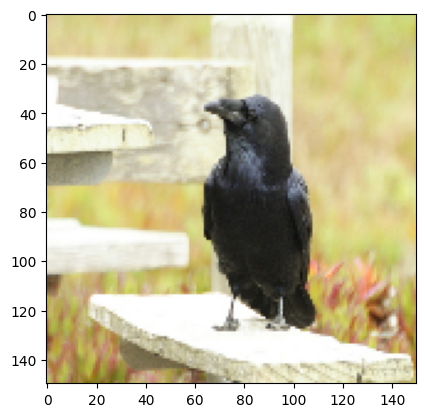


Showing the data shape: 
(150, 150, 3)

Showing the label:
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]


In [5]:
## Show a sample bird image, and highlight its shape and it's label array

import matplotlib.pyplot as plt

index = 5
print("Printing the Image of Index {} for current batch.".format(index))
print("Showing the image: ")
plt.imshow(data_batch_check[index])
plt.show()

print("\nShowing the data shape: ")
print(data_batch_check[index].shape)

print("\nShowing the label:")
print(labels_batch_check[index])

C:\Users\admin\AppData\Local\Temp\ipykernel_12928\4153145729.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='crest')


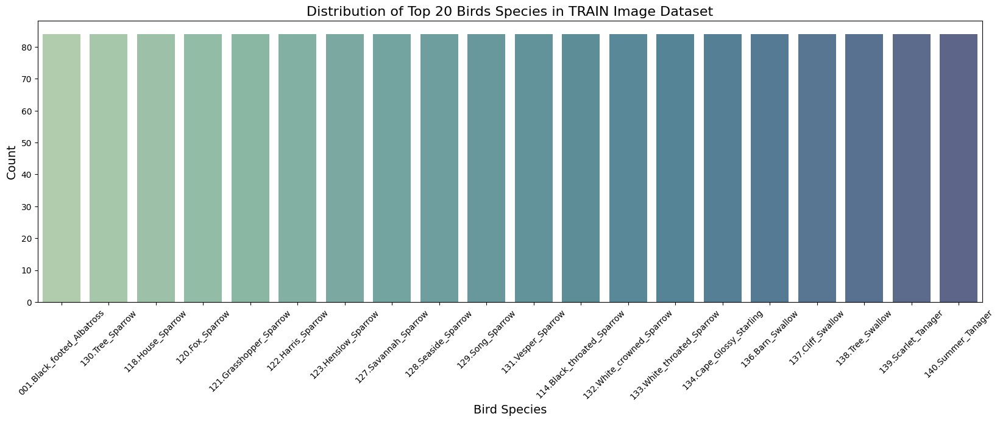

In [6]:
## what are the top 20 labels in the Image Dataset? 

import seaborn as sns

# Get the top 20 labels
label_counts = train_df['Label'].value_counts()[:20]

plt.figure(figsize=(20, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='crest')
plt.title('Distribution of Top 20 Birds Species in TRAIN Image Dataset', fontsize=16)
plt.xlabel('Bird Species', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.show()

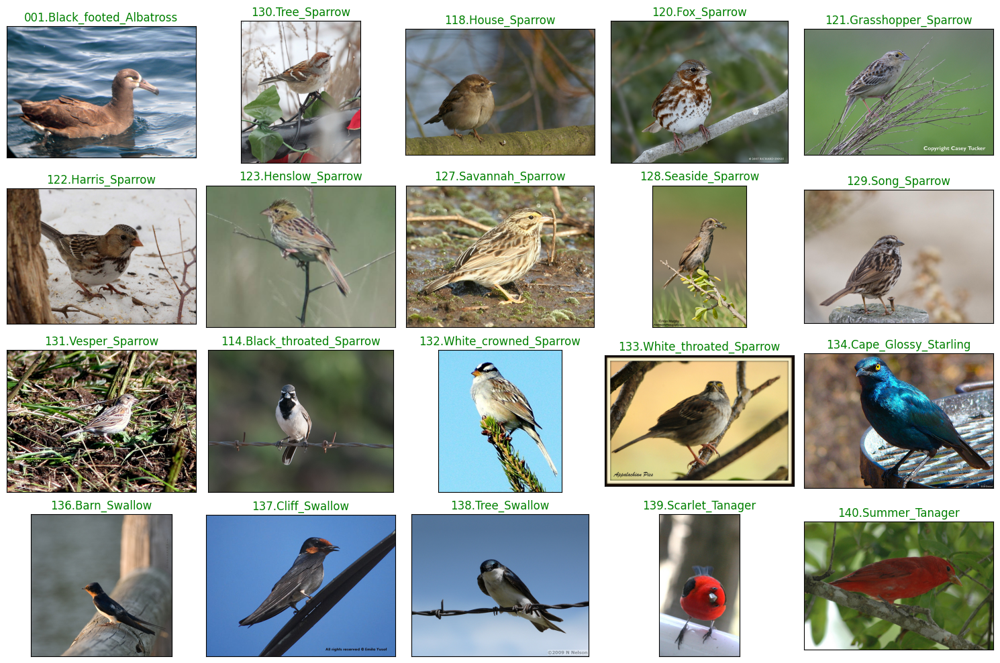

In [7]:
## print out the images of these top 20 bird species

dedup_train_df = train_df.drop_duplicates('Label')
dedup_train_df = dedup_train_df[dedup_train_df['Label'].isin(label_counts.index)]

dedup_train_df['Label'] = pd.Categorical(dedup_train_df['Label'], categories = label_counts.index)
dedup_train_df.sort_values('Label', inplace = True)
dedup_train_df.reset_index(drop = True, inplace = True)

fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(dedup_train_df.Filepath[i]))
    ax.set_title(dedup_train_df.Label[i], color = 'green')
plt.tight_layout()
plt.show()

In [8]:
def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    
    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # read compressed image
    compressed_img = cv2.imread(temp_filename)

    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff


def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    ela_filename = 'temp_ela.png'
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)

    ela_image = ImageChops.difference(image, temp_image)

    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1

    scale = 255.0 / max_diff
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    return ela_image


def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')
        
    items = list(items)
        
    p = random.choice(items)
    return p.as_posix()

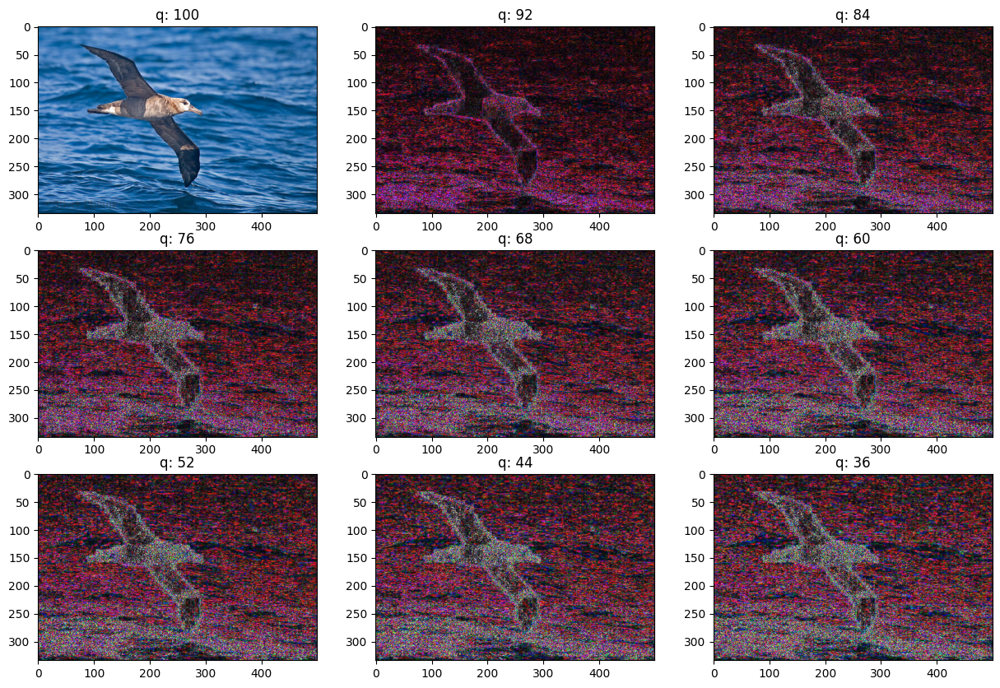

In [14]:
import cv2
import random
import matplotlib.pyplot as plt

# View random sample from the dataset
p = random_sample(r"C:\Users\admin\Documents\BIRDS\Birds525\train\001.Black_footed_Albatross")
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 8
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i) 
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

In [18]:
# instantiate a baseline CNN for Birds Classification
from tensorflow.keras import models, layers

## adding a base CNN network
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (150,150,3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation = 'relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation = 'relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation = 'relu'))
model.add(layers.MaxPooling2D((2, 2)))

## adding a classifier
model.add(layers.Flatten())
model.add(layers.Dense(512, activation = 'relu'))
model.add(layers.Dense(200, activation = 'softmax'))

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 200)            │       102,600 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,555,208 (13.56 MB)

 Trainable params: 3,555,208 (13.56 MB)

 Non-trainable params: 0 (0.00 B)

In [19]:
## compile the model for training
from tensorflow.keras import optimizers

model.compile(loss = 'categorical_crossentropy'
             ,optimizer = optimizers.RMSprop(learning_rate = 1e-4)
             ,metrics = ['acc'])

In [20]:
## history of the initial network training
history = model.fit(train_generator
         ,steps_per_epoch = 100
         ,epochs = 100
         ,validation_data = validation_generator
         ,validation_steps = 50)

Epoch 1/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - acc: 0.0039 - loss: 5.2998 - val_acc: 0.0040 - val_loss: 5.2973
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - acc: 0.0056 - loss: 5.2990 - val_acc: 0.0100 - val_loss: 5.2978
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - acc: 0.0068 - loss: 5.2925 - val_acc: 0.0090 - val_loss: 5.2938
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - acc: 0.0073 - loss: 5.2832 - val_acc: 0.0100 - val_loss: 5.2669
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - acc: 0.0144 - loss: 5.2383 - val_acc: 0.0060 - val_loss: 5.2242
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - acc: 0.0185 - loss: 5.1512 - val_acc: 0.0190 - val_loss: 5.1477
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - acc: 0.0269 - loss: 5.0658 - val_acc: 0.0260 - val_loss: 5.0558
Epoch 8/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - acc: 0.0355 - loss: 4.9256 - val_acc: 0.0340 - val_loss: 4.9596
Epoch 9/100
 24/100 ━━━━━━━━━

C:\Users\admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\trainers\epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - acc: 0.0290 - loss: 4.8721 - val_acc: 0.0370 - val_loss: 4.9264
Epoch 10/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - acc: 0.0397 - loss: 4.8289 - val_acc: 0.0340 - val_loss: 4.8954
Epoch 11/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - acc: 0.0538 - loss: 4.6744 - val_acc: 0.0280 - val_loss: 5.0233
Epoch 12/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - acc: 0.0582 - loss: 4.6441 - val_acc: 0.0430 - val_loss: 4.8135
Epoch 13/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - acc: 0.0625 - loss: 4.5520 - val_acc: 0.0480 - val_loss: 4.7308
Epoch 14/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - acc: 0.0660 - loss: 4.4720 - val_acc: 0.0390 - val_loss: 4.6836
Epoch 15/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - acc: 0.0806 - loss: 4.3699 - val_acc: 0.0600 - val_loss: 4.6022
Epoch 16/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - acc: 0.1006 - loss: 4.2979 - val_acc: 0.0500 - val_loss: 4.6316
Epoch 17/100
100/100 ━━━━━━━━━━━━━

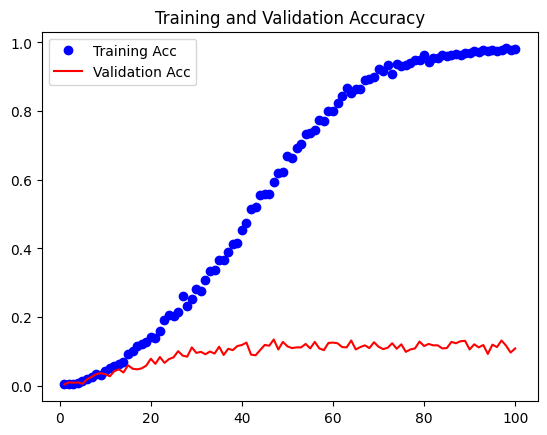

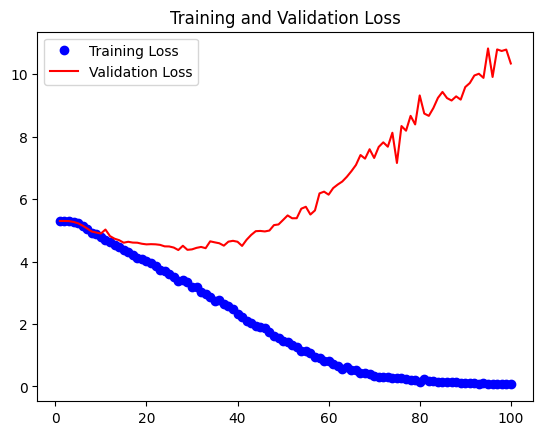

In [21]:
# Plot a learning curve.
# The learning curve will help us monitor if our baseline model is overfitting or underfitting.

import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label = 'Training Acc')
plt.plot(epochs, val_acc, 'r', label = 'Validation Acc')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label = 'Training Loss')
plt.plot(epochs, val_loss, 'r', label = 'Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()

In [23]:
model.save('birds525_baseline_1.h5')


In [24]:
from tensorflow.keras import models, layers

model = models.load_model('birds525_baseline_1.h5')

In [25]:
test_loss, test_acc = model.evaluate(test_generator, steps = 50)
print('test acc:', test_acc)

50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - acc: 0.1293 - loss: 9.9736
test acc: 0.13600000739097595


In [26]:
# get the Inception V3 base model
from tensorflow.keras.applications import InceptionV3

# set the base model without its dense classifier, with input shape = 150 x 150, and freeze it
base_model = InceptionV3(include_top = False, input_shape = (150, 150, 3))
base_model.trainable = False

base_model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step


Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 74, 74,    │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 74, 74,    │         96 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 74, 74,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 72, 72,    │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │         96 │ conv2d_9[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 72, 72,    │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │        192 │ conv2d_10[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 35, 35,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 35, 35,    │      5,120 │ max_pooling2d_8[… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 35, 35,    │        240 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 35, 35,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 33, 33,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 33, 33,    │        576 │ conv2d_12[0][0]   │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 33, 33,    │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 21,802,784 (83.17 MB)

In [27]:
from tensorflow.keras import layers, models

# define the hidden layers
x = base_model.get_layer('mixed10').output # mixed10 is the last layer of the base_model
x = layers.GlobalAveragePooling2D()(x) # global average is preferred over flatten becuase the lesser variables makes the network more efficient

# define the output layer
outputs = layers.Dense(200, activation = 'softmax')(x)

# create the model
model = models.Model(base_model.input, outputs)
model.summary()

Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 74, 74,    │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 74, 74,    │         96 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 74, 74,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 72, 72,    │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │         96 │ conv2d_9[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 72, 72,    │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │        192 │ conv2d_10[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 35, 35,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 35, 35,    │      5,120 │ max_pooling2d_8[… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 35, 35,    │        240 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 35, 35,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 33, 33,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 33, 33,    │        576 │ conv2d_12[0][0]   │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 33, 33,    │          0 │ batch_normalizat

 Total params: 22,212,584 (84.73 MB)

 Trainable params: 409,800 (1.56 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [28]:
# compile the model for training
from tensorflow.keras import optimizers

model.compile(loss = 'categorical_crossentropy'
             ,optimizer = optimizers.Adam(learning_rate = 0.01)
             ,metrics = ['acc'])

In [29]:
# training with flattened CNN
history = model.fit(train_generator
         ,steps_per_epoch = len(train_generator)
         ,epochs = 10
         ,validation_data = validation_generator
         ,validation_steps = int(0.25*len(validation_generator)))

Epoch 1/10
824/824 ━━━━━━━━━━━━━━━━━━━━ 80s 90ms/step - acc: 0.1754 - loss: 34.3297 - val_acc: 0.2341 - val_loss: 32.7306
Epoch 2/10
824/824 ━━━━━━━━━━━━━━━━━━━━ 72s 88ms/step - acc: 0.5064 - loss: 15.2173 - val_acc: 0.3045 - val_loss: 35.8126
Epoch 3/10
824/824 ━━━━━━━━━━━━━━━━━━━━ 72s 87ms/step - acc: 0.6316 - loss: 10.6063 - val_acc: 0.2989 - val_loss: 39.2965
Epoch 4/10
824/824 ━━━━━━━━━━━━━━━━━━━━ 71s 86ms/step - acc: 0.7181 - loss: 7.3887 - val_acc: 0.2864 - val_loss: 42.5547
Epoch 5/10
824/824 ━━━━━━━━━━━━━━━━━━━━ 72s 87ms/step - acc: 0.7629 - loss: 6.4907 - val_acc: 0.2830 - val_loss: 49.8078
Epoch 6/10
824/824 ━━━━━━━━━━━━━━━━━━━━ 71s 87ms/step - acc: 0.8078 - loss: 5.3409 - val_acc: 0.2807 - val_loss: 55.7556
Epoch 7/10
824/824 ━━━━━━━━━━━━━━━━━━━━ 72s 88ms/step - acc: 0.8304 - loss: 4.6710 - val_acc: 0.2864 - val_loss: 63.8472
Epoch 8/10
824/824 ━━━━━━━━━━━━━━━━━━━━ 72s 87ms/step - acc: 0.8444 - loss: 4.4306 - val_acc: 0.2943 - val_loss: 65.3864
Epoch 9/10
824/824 ━━━━━━━━━━

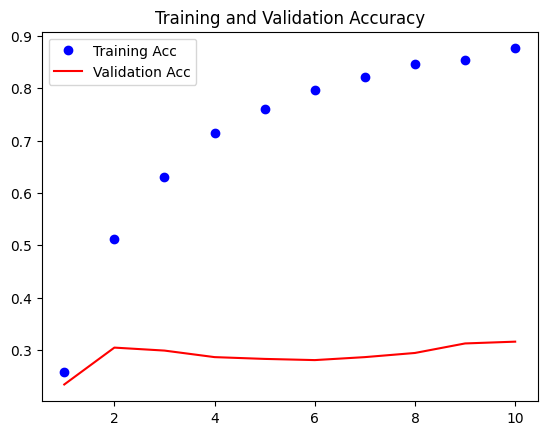

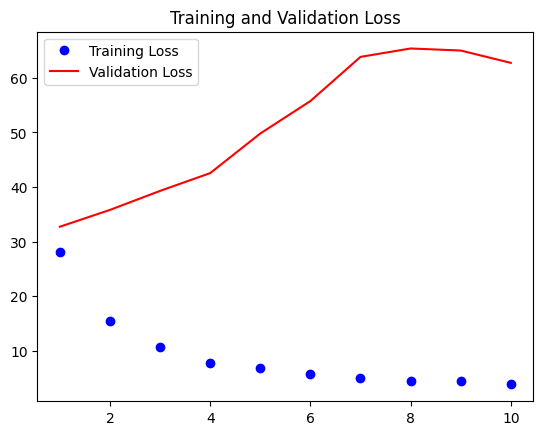

In [30]:
# plot learning curve
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label = 'Training Acc')
plt.plot(epochs, val_acc, 'r', label = 'Validation Acc')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label = 'Training Loss')
plt.plot(epochs, val_loss, 'r', label = 'Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()

In [31]:
test_loss, test_acc = model.evaluate(test_generator, steps = 50)
print('test acc:', test_acc)

50/50 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - acc: 0.3765 - loss: 66.2407
test acc: 0.36899998784065247


In [32]:
## fine-tuning of the above model. For this, we will unfreeze the top most 12 layers.
## These 12 layers are from the top 10 of the base model, and the newly added network.

model.trainable = True

# Un-freeze last 12 layers
for layer in model.layers[:-12]:
    layer.trainable = False

In [33]:
## with the unfreezing of the top most 12 layers, we will recompile it using a smaller learning rate.

model.compile(loss = 'categorical_crossentropy'
             ,optimizer = optimizers.Adam(learning_rate = 0.001)
             ,metrics = ['acc'])

In [34]:
initial_epochs = 10
fine_tune_epochs = initial_epochs + 3

# Refit the model
history_2 = model.fit(train_generator,
                       epochs = fine_tune_epochs,
                       validation_data = validation_generator,
                       validation_steps = int(0.25*len(validation_generator)),
                       initial_epoch =  history.epoch[-1],) # Start the epoch where it left before

Epoch 10/13
824/824 ━━━━━━━━━━━━━━━━━━━━ 80s 91ms/step - acc: 0.9588 - loss: 0.9206 - val_acc: 0.3568 - val_loss: 51.5030
Epoch 11/13
824/824 ━━━━━━━━━━━━━━━━━━━━ 72s 88ms/step - acc: 0.9964 - loss: 0.0206 - val_acc: 0.3534 - val_loss: 53.2268
Epoch 12/13
824/824 ━━━━━━━━━━━━━━━━━━━━ 72s 88ms/step - acc: 0.9991 - loss: 0.0079 - val_acc: 0.3398 - val_loss: 52.7388
Epoch 13/13
824/824 ━━━━━━━━━━━━━━━━━━━━ 72s 87ms/step - acc: 0.9993 - loss: 0.0067 - val_acc: 0.3602 - val_loss: 52.7128


In [35]:
test_loss, test_acc = model.evaluate(test_generator, steps = 50)
print('test acc:', test_acc)

50/50 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - acc: 0.4298 - loss: 49.5608
test acc: 0.4350000023841858


In [36]:
model.save('birds525_inceptionv3_1.h5')


In [37]:
from tensorflow.keras import models, layers

model = models.load_model('birds525_inceptionv3_1.h5')

In [38]:
import numpy as np

# use the model to predict all test images
pred = model.predict(test_generator)
pred = np.argmax(pred, axis = 1)

# Map the label
labels = (test_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

179/179 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step


In [39]:
from sklearn.metrics import classification_report, confusion_matrix

y_test = list(test_df.Label)
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

C:\Users\admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\metrics\_classificati

,precision,recall,f1-score,support
001.Black_footed_Albatross,0.500000,0.333333,0.400000,18.000000
002.Laysan_Albatross,0.666667,0.666667,0.666667,18.000000
003.Sooty_Albatross,0.600000,0.333333,0.428571,18.000000
004.Groove_billed_Ani,0.500000,0.333333,0.400000,18.000000
005.Crested_Auklet,0.714286,0.714286,0.714286,14.000000
...,...,...,...,...
199.Winter_Wren,0.833333,0.555556,0.666667,18.000000
200.Common_Yellowthroat,0.583333,0.777778,0.666667,18.000000
accuracy,0.378575,0.378575,0.378575,0.378575
macro avg,0.404359,0.379474,0.373284,3566.000000


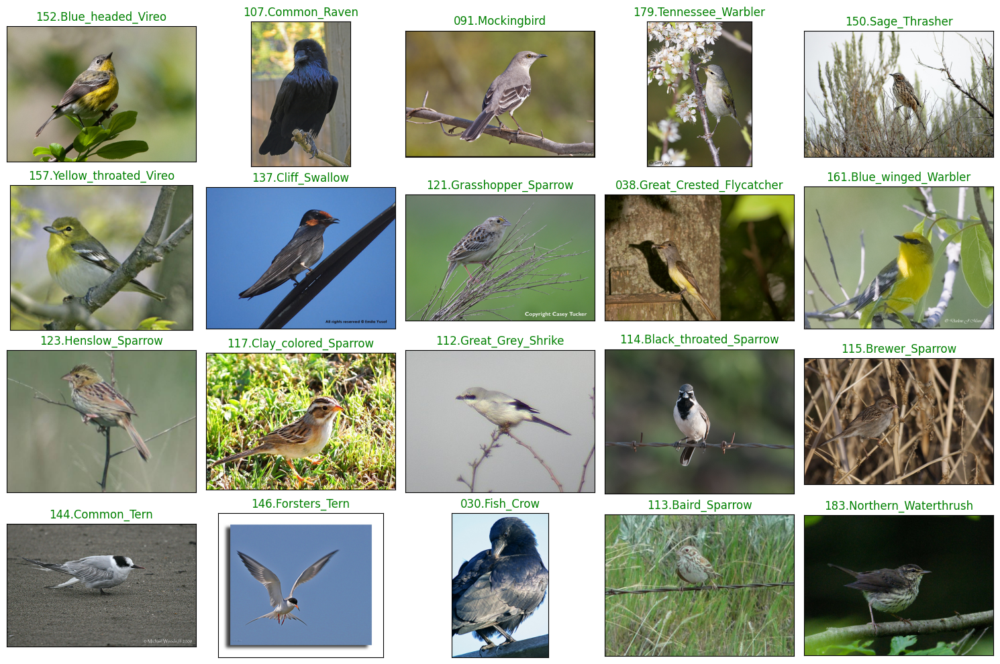

In [40]:
## print out the bottom 20 bird species that were not accurately predicted by our CNN

report_df = df.iloc[:-3].copy()
bottom20_birds_array = report_df.sort_values('f1-score')[:20].index

## print out the images of these top 20 bird species

dedup_train_df = train_df.drop_duplicates('Label')
dedup_train_df = dedup_train_df[dedup_train_df['Label'].isin(bottom20_birds_array)]

dedup_train_df['Label'] = pd.Categorical(dedup_train_df['Label'], categories = bottom20_birds_array)
dedup_train_df.sort_values('Label', inplace = True)
dedup_train_df.reset_index(drop = True, inplace = True)

fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(dedup_train_df.Filepath[i]))
    ax.set_title(dedup_train_df.Label[i], color = 'green')
plt.tight_layout()
plt.show()

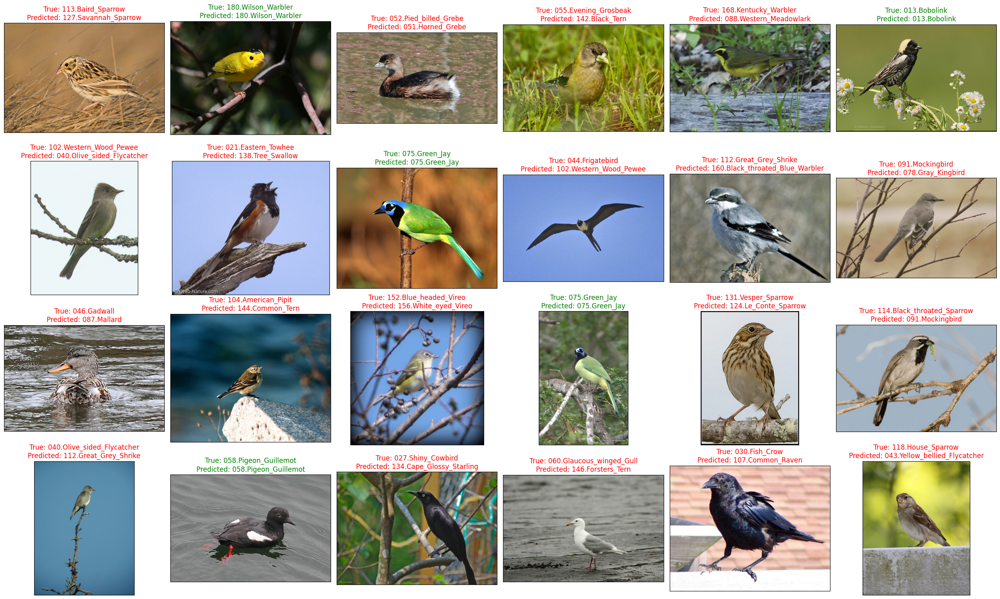

In [41]:
import matplotlib.pyplot as plt

# Display 24 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 24)
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)

plt.tight_layout()
plt.show()

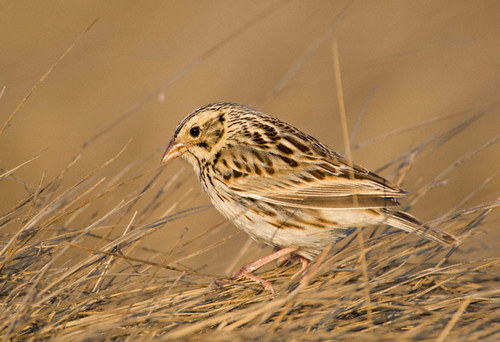

In [42]:
from IPython.display import Image, display
import matplotlib.cm as cm

# setting parameters
img_size = (150,150)
last_conv_layer_name = "conv2d_84" 
img_path = test_df.Filepath.iloc[random_index[0]]

# display the image
display(Image(img_path))

In [43]:
# create functions

import tensorflow as tf
from tensorflow import keras

def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


C:\Users\admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\models\functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_2']]
Received: inputs=Tensor(shape=(1, 150, 150, 3))
  warnings.warn(msg)


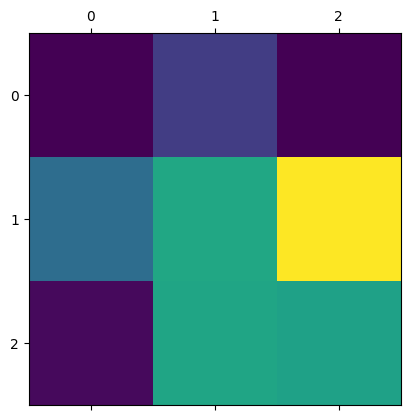

In [44]:
# Prepare image
from tensorflow.keras.utils import load_img, img_to_array

img = load_img(img_path, target_size = img_size)
img_array = img_to_array(img)
img_array = img_array * (1. / 255)
img_array = img_array.reshape((1, img_array.shape[0], img_array.shape[1], img_array.shape[2]))

# Remove last layer's softmax
model.layers[-1].activation = None

# Print what the top predicted class is
preds = model.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

In [45]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.9, return_images = False):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    if return_images:
        display(Image(cam_path))

    return cam_path

C:\Users\admin\AppData\Local\Temp\ipykernel_12928\503875767.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


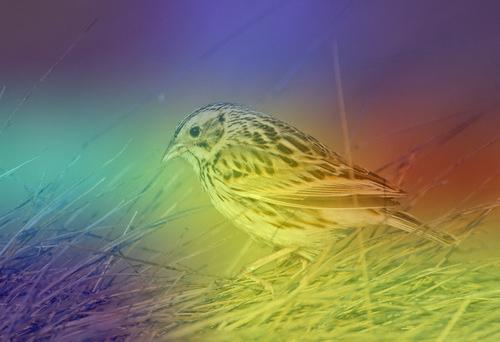

In [46]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.9, return_images = False):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    if return_images:
        display(Image(cam_path))

    return cam_path


_ = save_and_display_gradcam(img_path, heatmap, return_images = True)

In [47]:
#The more darkred regions are the localised areas of a picture that belongs to the given labelled prediction.

C:\Users\admin\AppData\Local\Temp\ipykernel_12928\503875767.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


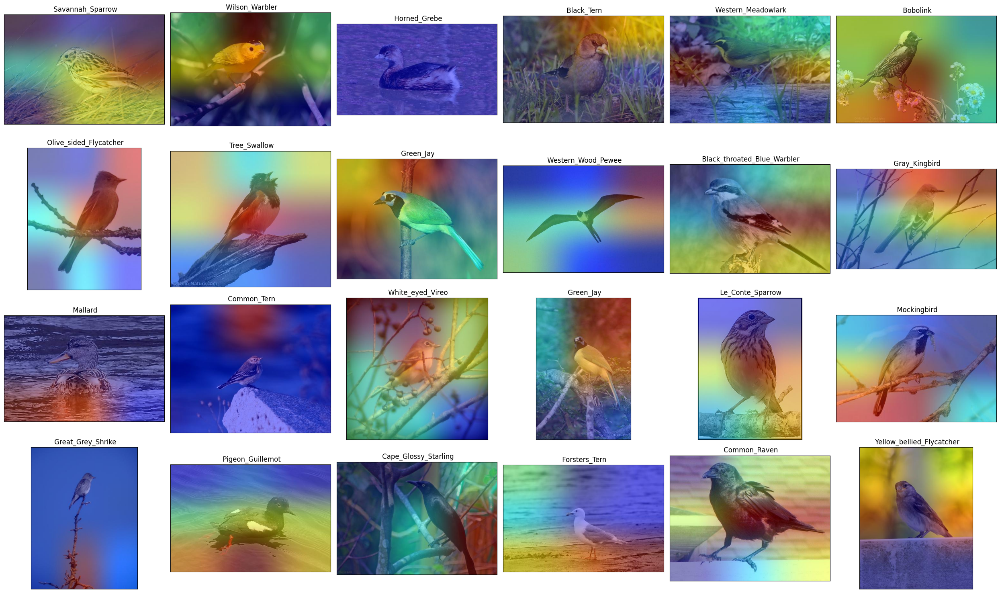

In [50]:
# with the predicted test images, let's take a look at how our model performs

import matplotlib.pyplot as plt

# Display 24 random pictures from the dataset with their labels
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    # load the image
    img_path = test_df.Filepath.iloc[random_index[i]]
    
    # prepare the image_array
    img = load_img(img_path, target_size = img_size)
    img_array = img_to_array(img)
    img_array = img_array * (1. / 255)
    img_array = img_array.reshape((1, img_array.shape[0], img_array.shape[1], img_array.shape[2]))

    # prepare the heatmap array
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    # plot the image
    ax.imshow(plt.imread(cam_path))
    # ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f" {(pred[random_index[i]])[4:]}")

plt.tight_layout()
plt.show()